# Transfer Learning on Food101 (Subset)

In this notebook, we will build a **transfer learning model** to classify images from a **subset of the Food101 dataset**, using **only 10 classes out of the 101 available**.  

To simplify experimentation, we will start by training our models on **40% of the dataset**. This allows us to quickly test and tune our configurations. This notebook represents an **exploratory stage** of our pipeline before we implement automated training scripts following **MLOps principles**.  

We will use the pre-trained models [`EfficientNet_B0`](https://docs.pytorch.org/vision/main/models/generated/torchvision.models.efficientnet_b0.html) and [`EfficientNet_B2`](https://docs.pytorch.org/vision/main/models/generated/torchvision.models.efficientnet_b2.html) from `torchvision` as the backbone for our transfer learning models.


In [56]:
!pip install mlflow

#1. Getting and exploring the data



In [57]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [58]:
import sys
sys.path.append('/content/drive/MyDrive/food101Mini')

In [59]:
!pip install -q torchinfo
from torchinfo import summary

In [60]:
import torch
import torchvision
from torchvision import transforms, models
import torch.nn as nn
from torch.utils.data import DataLoader
from src import data_setup, engine, predictions, utils
from pathlib import Path
import os
import pandas as pd
import numpy as np
import matplotlib
import sklearn
import tqdm
import mlflow


# Setup agnostic code
device = "cuda" if torch.cuda.is_available() else "cpu"

In [74]:
import importlib
importlib.reload(engine)
importlib.reload(utils)
importlib.reload(data_setup)

<module 'src.data_setup' from '/content/drive/MyDrive/food101Mini/src/data_setup.py'>

In [62]:
imgs_path = Path("./data/food101_subset")
url="https://github.com/Jsrodrigue/food101_prototipe/raw/main/data/food101_subset.zip"

In [63]:
data_setup.download_and_extract(url, imgs_path)

Destination data/food101_subset already contains files. Skipping download.


#1.1 Explore the pictures
We can visualize a sample of the train and test images with ther respective classes using the `plot_images_from_folder` function
from the module `utils.py`.



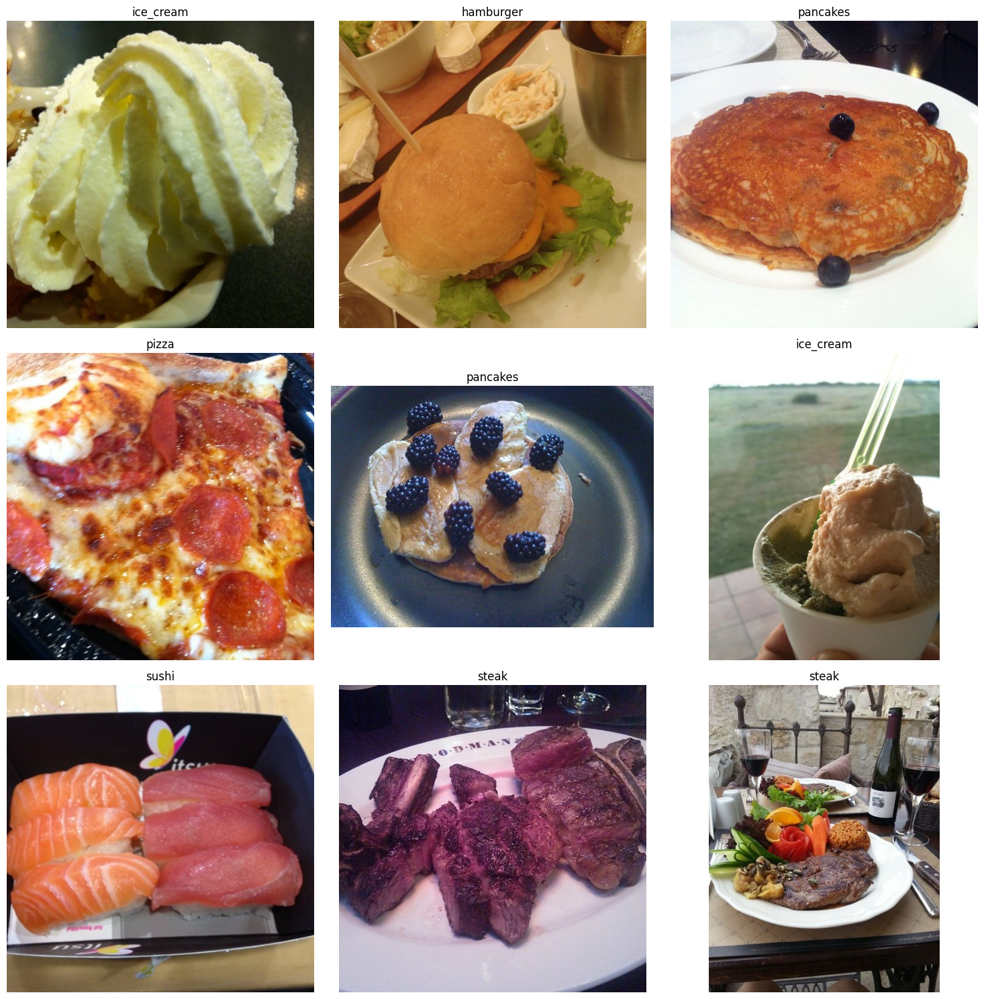

In [64]:
train_dir = imgs_path / "train"
test_dir = imgs_path / "test"

utils.plot_images_from_folder(train_dir, n=9)

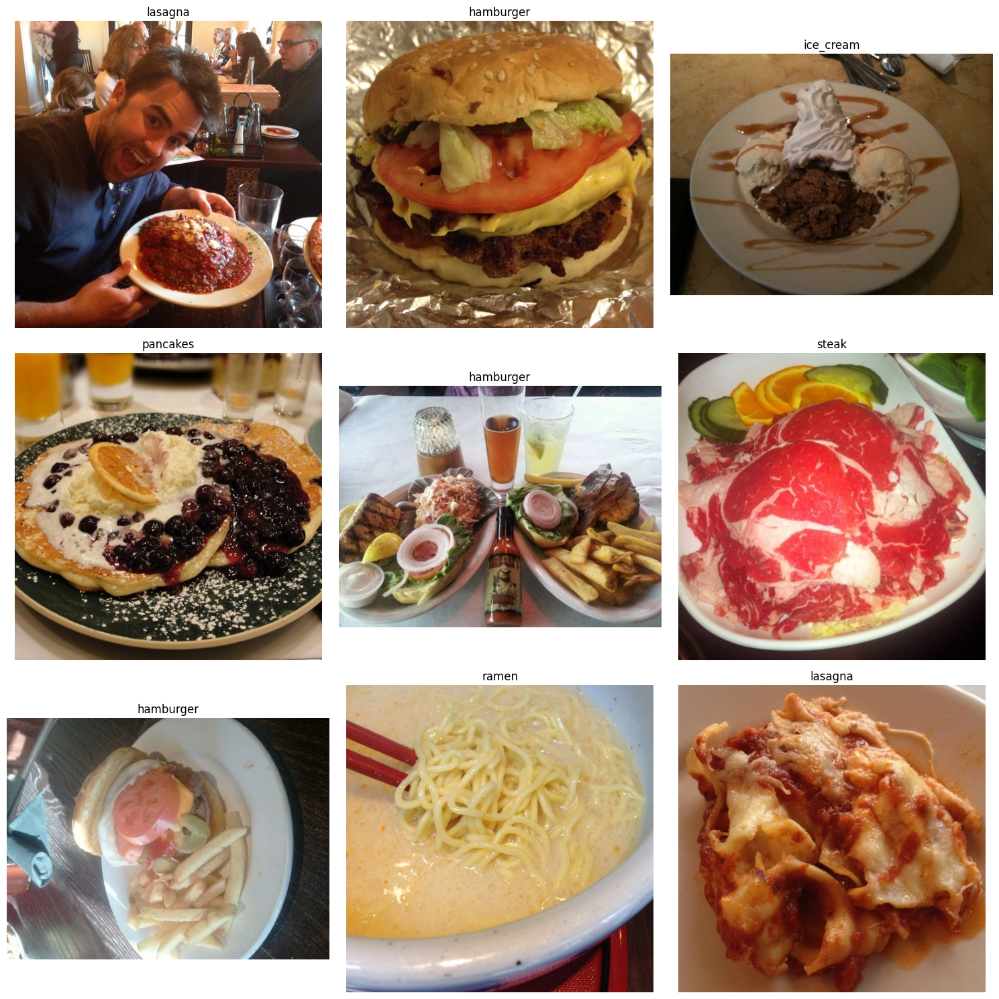

In [65]:
utils.plot_images_from_folder(test_dir, n=9)

# 2. Creating DataLoaders for experimentation

In PyTorch, a `DataLoader` helps us efficiently load data in mini-batches.  
It wraps a dataset and provides:

- **Batching**: splitting the dataset into smaller groups.  
- **Shuffling**: randomizing the order of samples each epoch.  
- **Parallel loading**: speeding up data loading using multiple workers.  

This allows us to feed our model with batches of images instead of loading all the data at once, which is much more efficient for training.  

We use the function `create_dataloaders` from `data_setup` to create our DataLoaders.  
Here, we will create **two training DataLoaders**: one using the transform from the pretrained model `EfficientNet_b0`, and another applying additional data augmentation.  

> **Note:** For initial experimentation, we are using only **40% of the data** from the 10 selected classes to quickly test and tune our models.




In [66]:
# Get weights and transform
weights = models.EfficientNet_B0_Weights.DEFAULT
# Transforms without augmentation
simple_transforms = weights.transforms()

# Transforms with Augmentation
aug_transforms = transforms.Compose([
    transforms.TrivialAugmentWide(),
    weights.transforms()
])

In [82]:
# Createdataloaders
batch_size=32
train_dataloader, test_dataloader, class_names = data_setup.create_dataloaders(train_dir=train_dir,
                                                 test_dir=test_dir,
                                                 train_transform=simple_transforms,
                                                 test_transform=simple_transforms,
                                                 subset_percentage=0.4,
                                                 batch_size=32)

aug_train_dataloader = data_setup.create_dataloaders(train_dir=train_dir,
                                                 test_dir=test_dir,
                                                 train_transform=aug_transforms,
                                                 test_transform=simple_transforms,
                                                 subset_percentage=0.4,
                                                 batch_size=32)[0]
# Check for the class names
print(f"Train_dataloader:     Num batches: {len(train_dataloader)}     |    Size batches: {batch_size}")
print(f"Test_dataloader:      Num batches: {len(test_dataloader)}      |    Size batches: {batch_size}")

print(f"\nClasses: {class_names}")

Train_dataloader:     Num batches: 10     |    Size batches: 32
Test_dataloader:      Num batches: 3      |    Size batches: 32

Classes: ['carrot_cake', 'hamburger', 'ice_cream', 'lasagna', 'pancakes', 'pizza', 'ramen', 'steak', 'sushi', 'tacos']


# 3. Models

We define two models by subclassing `nn.Module` and including a pretrained `EfficientNet` as one of its components.  
The final classification layer is replaced to match the number of classes in our dataset.  

This approach allows us to use **transfer learning**, leveraging features learned by EfficientNet while adapting the model to our specific task.  

In this experiment, we will train and test **EfficientNet-B0** and **EfficientNet-B2**.


In [68]:
import torch
import torch.nn as nn
from torchvision import models

class FoodEfficientNetb0(nn.Module):
    def __init__(self, num_classes):
        super().__init__()
        # Pretrained Efficienet model
        self.model = models.efficientnet_b0(weights=models.EfficientNet_B0_Weights.DEFAULT)
        in_features = self.model.classifier[1].in_features
        # Replace linear layer of the classifier to change the number of classes
        self.model.classifier[1] = nn.Linear(in_features, num_classes)

    def forward(self, x):
        return self.model(x)

class FoodEfficientNetb2(nn.Module):
    def __init__(self, num_classes):
        super().__init__()
        # Pretrained Efficienet model
        self.model = models.efficientnet_b2(weights=models.EfficientNet_B2_Weights.DEFAULT)
        in_features = self.model.classifier[1].in_features
        # Replace linear layer of the classifier to change the number of classes
        self.model.classifier[1] = nn.Linear(in_features, num_classes)

    def forward(self, x):
        return self.model(x)


# 4. Baseline model
Our baseline model will be a `FoodEficientNetb0` trained by 5 `epochs` with `Adam` optimizer and `lr=0.001`. With all the feature blocks frozen.

In [75]:
utils.set_seeds(42)
model_0 = FoodEfficientNetb0(num_classes=len(class_names)).to(device)

# Freeze all base blocks by setting theire requires_grad to false
epochs=10
lr=0.001

for param in model_0.model.features.parameters():
  param.requires_grad = False

# Define loss function and optimizer
loss_fn = nn.CrossEntropyLoss()
optimizer = torch.optim.Adam(model_0.model.parameters(), lr=0.001)

results = engine.train_mlflow(
    model=model_0.model,
    train_dataloader=train_dataloader,
    test_dataloader=test_dataloader,
    optimizer=optimizer,
    loss_fn=loss_fn,
    epochs=epochs,
    device=device,
    params={"lr": 0.001, "batch_size": 32},  # optional params
    dagshub_uri=None,  # local tracking
    experiment_name="foodmini_experiments"
)


Training:   0%|          | 0/10 [00:00<?, ?it/s]

Epoch 1/10: train_loss=2.2511, train_acc=0.1812, test_loss=2.0491, test_acc=0.4271
Epoch 2/10: train_loss=1.9011, train_acc=0.5125, test_loss=1.8427, test_acc=0.4896
Epoch 3/10: train_loss=1.6341, train_acc=0.7063, test_loss=1.7134, test_acc=0.6042
Epoch 4/10: train_loss=1.4521, train_acc=0.7688, test_loss=1.6100, test_acc=0.6042
Epoch 5/10: train_loss=1.2552, train_acc=0.8375, test_loss=1.5189, test_acc=0.6146
Epoch 6/10: train_loss=1.1007, train_acc=0.8656, test_loss=1.4325, test_acc=0.6146
Epoch 7/10: train_loss=0.9704, train_acc=0.8812, test_loss=1.3727, test_acc=0.6250
Epoch 8/10: train_loss=0.8818, train_acc=0.8625, test_loss=1.3192, test_acc=0.6354
Epoch 9/10: train_loss=0.8093, train_acc=0.9031, test_loss=1.2797, test_acc=0.6354
Epoch 10/10: train_loss=0.7314, train_acc=0.9125, test_loss=1.2424, test_acc=0.6667


2025/09/24 00:26:53 WARNING mlflow.models.signature: Failed to infer the model signature from the input example. Reason: RuntimeError('Input type (torch.FloatTensor) and weight type (torch.cuda.FloatTensor) should be the same or input should be a MKLDNN tensor and weight is a dense tensor'). To see the full traceback, set the logging level to DEBUG via `logging.getLogger("mlflow").setLevel(logging.DEBUG)`.
2025/09/24 00:26:54 WARNING mlflow.models.model: Failed to validate serving input example {
  "inputs": [
    [
      [
        [
          .... Alternatively, you can avoid passing input example and pass model signature instead when logging the model. To ensure the input example is valid prior to serving, please try calling `mlflow.models.validate_serving_input` on the model uri and serving input example. A serving input example can be generated from model input example using `mlflow.models.convert_input_example_to_serving_input` function.
Got error: Input type (torch.cuda.DoubleTen

We see that our baseline model has an accuracy of 55%. In the next section we will perfomr several experiments and try to get a better model.

#5. Experiments

We will train and evaluate models on 10 classes of Food101 using a subset (40%) of the data.  
Later, using scripts we will compare **two pretrained models**: EfficientNet-B0 and EfficientNet-B2.  

**Setup:**

- **Data augmentation:** simple transformations (flips, rotations, color jitter) vs. no augmentation.  
- **Fine-tuning:** unfreeze the last 2 blocks of the pretrained models.  
- **Number of epochs:** 10 and 15.  
- **Learning rate:** fixed at 0.001.  
- **Data split:** training with/without augmentation, validation/test without augmentation.  
- **Tracking:** TensorBoard for loss, accuracy, and model graph.  
- **Saving:** all trained models saved for later evaluation.

This allows us to study the effects of **fine-tuning, data augmentation, and training duration** on performance.


# 5.1 Augmentation Vs No augmentation

First we will compare the performance of the two models changing the dataLoader for the augmented one.

In [83]:
import time
# ===============================
# Basic configuration
# ===============================
device = "cuda" if torch.cuda.is_available() else "cpu"
utils.set_seeds(42)

# ===============================
# Experiments setup
# ===============================
models_to_test = {
    "EfficientNetB0": FoodEfficientNetb0,
    "EfficientNetB2": FoodEfficientNetb2
}

# Fixed hyperparameters
epochs = 10
learning_rate = 0.001

# Two training dataloaders: with augmentation and without augmentation
train_dataloaders = {
    "augmented": aug_train_dataloader,
    "no_aug": train_dataloader
}

# ===============================
# Loop over models and dataloaders
# ===============================
for model_name, model_class in models_to_test.items():
    for aug_type, train_dl in train_dataloaders.items():
        print(f"\n--- Experiment: {model_name}, {aug_type}, epochs={epochs}, lr={learning_rate} ---")

        # Initialize the model
        model = model_class(num_classes=len(class_names)).to(device)

        # Freeze all feature extractor blocks initially
        for param in model.model.features.parameters():
            param.requires_grad = False

        # Define optimizer to update only trainable parameters
        optimizer = torch.optim.Adam(filter(lambda p: p.requires_grad, model.parameters()), lr=learning_rate)
        loss_fn = nn.CrossEntropyLoss()

        # ===============================
        # Training with timing
        # ===============================
        start_time = time.time()

        engine.train_mlflow(
            model=model,
            train_dataloader=train_dl,
            test_dataloader=test_dataloader,
            optimizer=optimizer,
            loss_fn=loss_fn,
            epochs=epochs,
            device=device,
            params={
                "lr": learning_rate,
                "batch_size": train_dl.batch_size,
                "augmentation": aug_type
            },
            dagshub_uri=None,
            experiment_name="foodmini_experiments"
        )

        end_time = time.time()
        elapsed_time = end_time - start_time
        print(f"[INFO] Training time for {model_name} | {aug_type} | epochs={epochs} | lr={learning_rate}: {elapsed_time:.2f} seconds")
        print(f"[INFO] Finished experiment {model_name} | {aug_type} | epochs={epochs} | lr={learning_rate}")



--- Experiment: EfficientNetB0, augmented, epochs=10, lr=0.001 ---


Training:   0%|          | 0/10 [00:00<?, ?it/s]

Epoch 1/10: train_loss=2.2590, train_acc=0.1437, test_loss=2.0646, test_acc=0.3750
Epoch 2/10: train_loss=1.9869, train_acc=0.4281, test_loss=1.8576, test_acc=0.5000
Epoch 3/10: train_loss=1.7371, train_acc=0.6250, test_loss=1.7129, test_acc=0.6042
Epoch 4/10: train_loss=1.5947, train_acc=0.6969, test_loss=1.5960, test_acc=0.6250
Epoch 5/10: train_loss=1.4113, train_acc=0.7312, test_loss=1.5058, test_acc=0.6354
Epoch 6/10: train_loss=1.2980, train_acc=0.7594, test_loss=1.4145, test_acc=0.6458
Epoch 7/10: train_loss=1.1517, train_acc=0.8031, test_loss=1.3578, test_acc=0.6667
Epoch 8/10: train_loss=1.0672, train_acc=0.8063, test_loss=1.2999, test_acc=0.6875
Epoch 9/10: train_loss=0.9982, train_acc=0.8219, test_loss=1.2600, test_acc=0.6667
Epoch 10/10: train_loss=0.9693, train_acc=0.7969, test_loss=1.2165, test_acc=0.6667


2025/09/24 00:40:38 WARNING mlflow.models.signature: Failed to infer the model signature from the input example. Reason: RuntimeError('Input type (torch.FloatTensor) and weight type (torch.cuda.FloatTensor) should be the same or input should be a MKLDNN tensor and weight is a dense tensor'). To see the full traceback, set the logging level to DEBUG via `logging.getLogger("mlflow").setLevel(logging.DEBUG)`.
2025/09/24 00:40:39 WARNING mlflow.models.model: Failed to validate serving input example {
  "inputs": [
    [
      [
        [
          .... Alternatively, you can avoid passing input example and pass model signature instead when logging the model. To ensure the input example is valid prior to serving, please try calling `mlflow.models.validate_serving_input` on the model uri and serving input example. A serving input example can be generated from model input example using `mlflow.models.convert_input_example_to_serving_input` function.
Got error: Input type (torch.cuda.DoubleTen

[INFO] Training time for EfficientNetB0 | augmented | epochs=10 | lr=0.001: 38.10 seconds
[INFO] Finished experiment EfficientNetB0 | augmented | epochs=10 | lr=0.001

--- Experiment: EfficientNetB0, no_aug, epochs=10, lr=0.001 ---


Training:   0%|          | 0/10 [00:00<?, ?it/s]

Epoch 1/10: train_loss=2.2637, train_acc=0.1531, test_loss=2.0515, test_acc=0.3750
Epoch 2/10: train_loss=1.9300, train_acc=0.4656, test_loss=1.8519, test_acc=0.5104
Epoch 3/10: train_loss=1.6582, train_acc=0.7031, test_loss=1.7178, test_acc=0.5938
Epoch 4/10: train_loss=1.4589, train_acc=0.7750, test_loss=1.6149, test_acc=0.6875
Epoch 5/10: train_loss=1.2736, train_acc=0.8313, test_loss=1.5228, test_acc=0.6667
Epoch 6/10: train_loss=1.1127, train_acc=0.8719, test_loss=1.4335, test_acc=0.6562
Epoch 7/10: train_loss=0.9768, train_acc=0.8938, test_loss=1.3731, test_acc=0.6562
Epoch 8/10: train_loss=0.8855, train_acc=0.8875, test_loss=1.3173, test_acc=0.6667
Epoch 9/10: train_loss=0.8197, train_acc=0.9031, test_loss=1.2785, test_acc=0.6667
Epoch 10/10: train_loss=0.7325, train_acc=0.9250, test_loss=1.2393, test_acc=0.6979


2025/09/24 00:41:10 WARNING mlflow.models.signature: Failed to infer the model signature from the input example. Reason: RuntimeError('Input type (torch.FloatTensor) and weight type (torch.cuda.FloatTensor) should be the same or input should be a MKLDNN tensor and weight is a dense tensor'). To see the full traceback, set the logging level to DEBUG via `logging.getLogger("mlflow").setLevel(logging.DEBUG)`.
2025/09/24 00:41:11 WARNING mlflow.models.model: Failed to validate serving input example {
  "inputs": [
    [
      [
        [
          .... Alternatively, you can avoid passing input example and pass model signature instead when logging the model. To ensure the input example is valid prior to serving, please try calling `mlflow.models.validate_serving_input` on the model uri and serving input example. A serving input example can be generated from model input example using `mlflow.models.convert_input_example_to_serving_input` function.
Got error: Input type (torch.cuda.DoubleTen

[INFO] Training time for EfficientNetB0 | no_aug | epochs=10 | lr=0.001: 31.69 seconds
[INFO] Finished experiment EfficientNetB0 | no_aug | epochs=10 | lr=0.001

--- Experiment: EfficientNetB2, augmented, epochs=10, lr=0.001 ---


Training:   0%|          | 0/10 [00:00<?, ?it/s]

Epoch 1/10: train_loss=2.2482, train_acc=0.1406, test_loss=2.1430, test_acc=0.2917
Epoch 2/10: train_loss=1.9987, train_acc=0.4250, test_loss=1.9672, test_acc=0.5521
Epoch 3/10: train_loss=1.8179, train_acc=0.5687, test_loss=1.8366, test_acc=0.5938
Epoch 4/10: train_loss=1.6805, train_acc=0.6375, test_loss=1.7244, test_acc=0.6667
Epoch 5/10: train_loss=1.4873, train_acc=0.7438, test_loss=1.6307, test_acc=0.6667
Epoch 6/10: train_loss=1.4150, train_acc=0.7281, test_loss=1.5502, test_acc=0.6875
Epoch 7/10: train_loss=1.2449, train_acc=0.8156, test_loss=1.4907, test_acc=0.6771
Epoch 8/10: train_loss=1.1817, train_acc=0.7906, test_loss=1.4137, test_acc=0.6771
Epoch 9/10: train_loss=1.1174, train_acc=0.8000, test_loss=1.3543, test_acc=0.6667
Epoch 10/10: train_loss=1.0715, train_acc=0.7969, test_loss=1.3176, test_acc=0.6458


2025/09/24 00:41:50 WARNING mlflow.models.signature: Failed to infer the model signature from the input example. Reason: RuntimeError('Input type (torch.FloatTensor) and weight type (torch.cuda.FloatTensor) should be the same or input should be a MKLDNN tensor and weight is a dense tensor'). To see the full traceback, set the logging level to DEBUG via `logging.getLogger("mlflow").setLevel(logging.DEBUG)`.
2025/09/24 00:41:56 WARNING mlflow.models.model: Failed to validate serving input example {
  "inputs": [
    [
      [
        [
          .... Alternatively, you can avoid passing input example and pass model signature instead when logging the model. To ensure the input example is valid prior to serving, please try calling `mlflow.models.validate_serving_input` on the model uri and serving input example. A serving input example can be generated from model input example using `mlflow.models.convert_input_example_to_serving_input` function.
Got error: Input type (torch.cuda.DoubleTen

[INFO] Training time for EfficientNetB2 | augmented | epochs=10 | lr=0.001: 44.84 seconds
[INFO] Finished experiment EfficientNetB2 | augmented | epochs=10 | lr=0.001

--- Experiment: EfficientNetB2, no_aug, epochs=10, lr=0.001 ---


Training:   0%|          | 0/10 [00:00<?, ?it/s]

Epoch 1/10: train_loss=2.2539, train_acc=0.1344, test_loss=2.1439, test_acc=0.2812
Epoch 2/10: train_loss=1.9582, train_acc=0.4813, test_loss=1.9554, test_acc=0.5312
Epoch 3/10: train_loss=1.7163, train_acc=0.6844, test_loss=1.8248, test_acc=0.5833
Epoch 4/10: train_loss=1.5305, train_acc=0.7781, test_loss=1.7200, test_acc=0.6667
Epoch 5/10: train_loss=1.3387, train_acc=0.8500, test_loss=1.6285, test_acc=0.6562
Epoch 6/10: train_loss=1.2317, train_acc=0.8406, test_loss=1.5504, test_acc=0.6354
Epoch 7/10: train_loss=1.0615, train_acc=0.9000, test_loss=1.4874, test_acc=0.6562
Epoch 8/10: train_loss=0.9645, train_acc=0.8844, test_loss=1.4197, test_acc=0.6667
Epoch 9/10: train_loss=0.8924, train_acc=0.9094, test_loss=1.3601, test_acc=0.6562
Epoch 10/10: train_loss=0.8455, train_acc=0.9062, test_loss=1.3292, test_acc=0.6667


2025/09/24 00:42:29 WARNING mlflow.models.signature: Failed to infer the model signature from the input example. Reason: RuntimeError('Input type (torch.FloatTensor) and weight type (torch.cuda.FloatTensor) should be the same or input should be a MKLDNN tensor and weight is a dense tensor'). To see the full traceback, set the logging level to DEBUG via `logging.getLogger("mlflow").setLevel(logging.DEBUG)`.
2025/09/24 00:42:29 WARNING mlflow.models.model: Failed to validate serving input example {
  "inputs": [
    [
      [
        [
          .... Alternatively, you can avoid passing input example and pass model signature instead when logging the model. To ensure the input example is valid prior to serving, please try calling `mlflow.models.validate_serving_input` on the model uri and serving input example. A serving input example can be generated from model input example using `mlflow.models.convert_input_example_to_serving_input` function.
Got error: Input type (torch.cuda.DoubleTen

[INFO] Training time for EfficientNetB2 | no_aug | epochs=10 | lr=0.001: 33.62 seconds
[INFO] Finished experiment EfficientNetB2 | no_aug | epochs=10 | lr=0.001


Experiments with EfficientNetB0 and B2 on the Food101 Mini dataset showed moderate performance, with test accuracies around 65–70% after 10 epochs. B0 without augmentation achieved the highest training accuracy (92%) and test accuracy (69%), suggesting slight overfitting. B2 trained slower and did not outperform B0 significantly, likely due to the small dataset.

# Fine Tuning
We will focus on fine-tuning by unfreezing the last blocks of the feature extractor. For this purpose, we will only record the results of one model while varying the learning rate and the number of blocks unfrozen. Specifically, we will compare the effects of unfreezing 2 blocks versus 3 blocks. In this experiment, we will use the augmented dataset to increase data variability, helping the model generalize better and reduce overfitting.


In [84]:
import torch
import torch.nn as nn
from src.utils import set_seeds
from src.engine import train_mlflow  # use your MLflow training function
import time
import mlflow

# ===============================
# Configuration
# ===============================
device = "cuda" if torch.cuda.is_available() else "cpu"
set_seeds(42)

# Model to fine-tune
model_name = "EfficientNetB0"
model_class = FoodEfficientNetb0

# Hyperparameters
learning_rate = 0.001
epochs = 15

# List of unfreeze configurations
unfreeze_configs = [2, 3]  # last 2 blocks vs last 3 blocks

for unfreeze_last_n in unfreeze_configs:
    print(f"\n--- Fine-tuning {model_name} | epochs={epochs} | lr={learning_rate} | unfreeze last {unfreeze_last_n} blocks ---")

    # Initialize model
    model = model_class(num_classes=len(class_names)).to(device)

    # Freeze all feature blocks
    all_params = list(model.model.features.parameters())
    for param in all_params:
        param.requires_grad = False

    # Unfreeze last n blocks of the feature extractor
    for param in all_params[-unfreeze_last_n:]:
        param.requires_grad = True

    # Loss and optimizer (only trainable params)
    loss_fn = nn.CrossEntropyLoss()
    optimizer = torch.optim.Adam(filter(lambda p: p.requires_grad, model.parameters()), lr=learning_rate)

    # Train with MLflow
    start_time = time.time()
    results = train_mlflow(
        model=model,
        train_dataloader=aug_train_dataloader,
        test_dataloader=test_dataloader,
        optimizer=optimizer,
        loss_fn=loss_fn,
        epochs=epochs,
        device=device,
        params={
            "lr": learning_rate,
            "batch_size": aug_train_dataloader.batch_size,
            "unfreeze_last_n": unfreeze_last_n
        },
        dagshub_uri=None,                # use local MLflow tracking
        experiment_name="foodmini_finetuning"
    )

    # Save the model in MLflow with a unique name per experiment
    example_input, _ = next(iter(aug_train_dataloader))
    example_input = example_input[:1].cpu().numpy()  # convert to NumPy for MLflow

    mlflow.pytorch.log_model(
        pytorch_model=model,
        name=f"model_unfreeze_{unfreeze_last_n}",  # unique model name
        input_example=example_input,
        pip_requirements=["torch==2.8.0", "torchvision==0.23.0"]
    )

    elapsed_time = time.time() - start_time
    print(f"[INFO] Fine-tuning completed in {elapsed_time:.2f} seconds for unfreeze_last_{unfreeze_last_n}")




--- Fine-tuning EfficientNetB0 | epochs=15 | lr=0.001 | unfreeze last 2 blocks ---


Training:   0%|          | 0/15 [00:00<?, ?it/s]

Epoch 1/15: train_loss=2.2590, train_acc=0.1437, test_loss=2.0635, test_acc=0.3750
Epoch 2/15: train_loss=1.9855, train_acc=0.4313, test_loss=1.8555, test_acc=0.5000
Epoch 3/15: train_loss=1.7337, train_acc=0.6250, test_loss=1.7090, test_acc=0.6042
Epoch 4/15: train_loss=1.5892, train_acc=0.7031, test_loss=1.5895, test_acc=0.6250
Epoch 5/15: train_loss=1.4022, train_acc=0.7344, test_loss=1.4963, test_acc=0.6354
Epoch 6/15: train_loss=1.2858, train_acc=0.7594, test_loss=1.4018, test_acc=0.6458
Epoch 7/15: train_loss=1.1352, train_acc=0.8031, test_loss=1.3417, test_acc=0.6667
Epoch 8/15: train_loss=1.0480, train_acc=0.8063, test_loss=1.2811, test_acc=0.6875
Epoch 9/15: train_loss=0.9748, train_acc=0.8250, test_loss=1.2393, test_acc=0.6771
Epoch 10/15: train_loss=0.9442, train_acc=0.8000, test_loss=1.1948, test_acc=0.6667
Epoch 11/15: train_loss=0.8599, train_acc=0.8344, test_loss=1.1474, test_acc=0.6875
Epoch 12/15: train_loss=0.8316, train_acc=0.8344, test_loss=1.0983, test_acc=0.6875
E

2025/09/24 00:48:12 WARNING mlflow.models.signature: Failed to infer the model signature from the input example. Reason: RuntimeError('Input type (torch.FloatTensor) and weight type (torch.cuda.FloatTensor) should be the same or input should be a MKLDNN tensor and weight is a dense tensor'). To see the full traceback, set the logging level to DEBUG via `logging.getLogger("mlflow").setLevel(logging.DEBUG)`.
2025/09/24 00:48:13 WARNING mlflow.models.model: Failed to validate serving input example {
  "inputs": [
    [
      [
        [
          .... Alternatively, you can avoid passing input example and pass model signature instead when logging the model. To ensure the input example is valid prior to serving, please try calling `mlflow.models.validate_serving_input` on the model uri and serving input example. A serving input example can be generated from model input example using `mlflow.models.convert_input_example_to_serving_input` function.
Got error: Input type (torch.cuda.DoubleTen

[INFO] Fine-tuning completed in 56.04 seconds for unfreeze_last_2

--- Fine-tuning EfficientNetB0 | epochs=15 | lr=0.001 | unfreeze last 3 blocks ---


Training:   0%|          | 0/15 [00:00<?, ?it/s]

Epoch 1/15: train_loss=2.1633, train_acc=0.2687, test_loss=1.7928, test_acc=0.6146
Epoch 2/15: train_loss=1.6164, train_acc=0.6937, test_loss=1.4234, test_acc=0.6875
Epoch 3/15: train_loss=1.1923, train_acc=0.7875, test_loss=1.2042, test_acc=0.6979
Epoch 4/15: train_loss=0.9508, train_acc=0.8156, test_loss=1.0548, test_acc=0.6979
Epoch 5/15: train_loss=0.7114, train_acc=0.8594, test_loss=0.9636, test_acc=0.7708
Epoch 6/15: train_loss=0.6314, train_acc=0.8719, test_loss=0.8948, test_acc=0.7396
Epoch 7/15: train_loss=0.4538, train_acc=0.9187, test_loss=0.8686, test_acc=0.7292
Epoch 8/15: train_loss=0.4155, train_acc=0.9219, test_loss=0.8423, test_acc=0.7292
Epoch 9/15: train_loss=0.3266, train_acc=0.9375, test_loss=0.8272, test_acc=0.7292
Epoch 10/15: train_loss=0.3440, train_acc=0.9313, test_loss=0.8080, test_acc=0.7396
Epoch 11/15: train_loss=0.2828, train_acc=0.9375, test_loss=0.7906, test_acc=0.7500
Epoch 12/15: train_loss=0.2861, train_acc=0.9469, test_loss=0.7667, test_acc=0.7500
E

2025/09/24 00:49:08 WARNING mlflow.models.signature: Failed to infer the model signature from the input example. Reason: RuntimeError('Input type (torch.FloatTensor) and weight type (torch.cuda.FloatTensor) should be the same or input should be a MKLDNN tensor and weight is a dense tensor'). To see the full traceback, set the logging level to DEBUG via `logging.getLogger("mlflow").setLevel(logging.DEBUG)`.
2025/09/24 00:49:09 WARNING mlflow.models.model: Failed to validate serving input example {
  "inputs": [
    [
      [
        [
          .... Alternatively, you can avoid passing input example and pass model signature instead when logging the model. To ensure the input example is valid prior to serving, please try calling `mlflow.models.validate_serving_input` on the model uri and serving input example. A serving input example can be generated from model input example using `mlflow.models.convert_input_example_to_serving_input` function.
Got error: Input type (torch.cuda.DoubleTen

[INFO] Fine-tuning completed in 55.95 seconds for unfreeze_last_3


We note that the model performs much better if we unfreezed the las three blocks. In furhter experiments we will include a scheduler to avoid overfiting. We note that making experiments in notebboks become hard to follow. We will make scripts to automaticate this task.

# Ploting predictions

In [85]:
from pathlib import Path
import random
from src.predictions import pred_and_plot_image

def plot_random_predictions(model: torch.nn.Module,
                            test_dir: str,
                            class_names: list,
                            num_images: int = 10,
                            transform=None,
                            image_size=(224, 224),
                            device=torch.device('cpu')):
    """
    Randomly samples images from a test directory, extracts true labels,
    makes predictions with the model, and plots them with true vs predicted labels.

    Args:
        model: Trained PyTorch model.
        test_dir: Directory with subfolders per class containing images.
        class_names: List of class names.
        num_images: Number of images to sample and plot.
        transform: Optional torchvision transform.
        image_size: Tuple (height, width) for resizing images.
        device: Target device ('cpu' or 'cuda').
    """
    # Get all image paths
    image_paths = list(Path(test_dir).glob("*/*.jpg"))
    sampled_paths = random.sample(image_paths, k=num_images)

    # Extract true labels from folder names
    true_labels = [p.parent.name for p in sampled_paths]

    # Plot predictions
    for img_path, true_label in zip(sampled_paths, true_labels):
        pred_and_plot_image(
            model=model,
            image_path=img_path,
            class_names=class_names,
            true_label=true_label,
            transform=transform,
            image_size=image_size,
            device=device
        )


To end this notebook lets make some predictions using our best model that is the best model saved in the instance model.

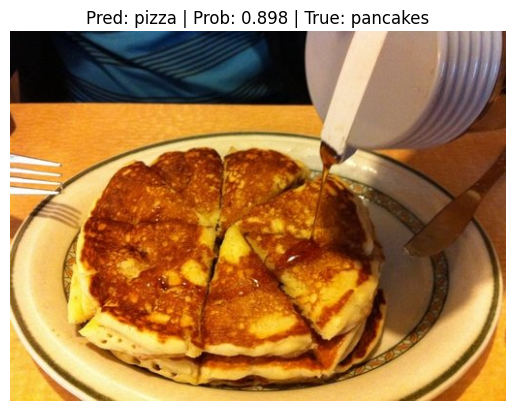

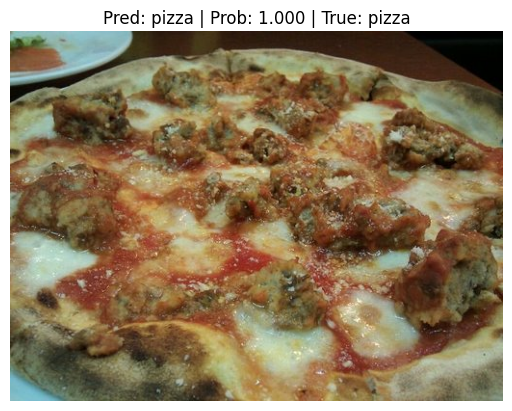

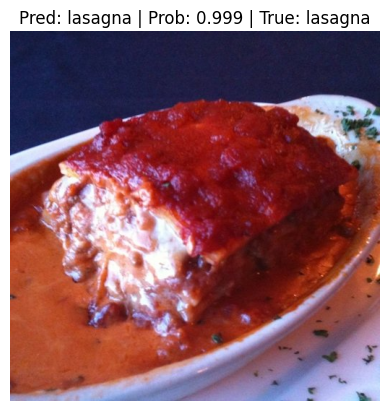

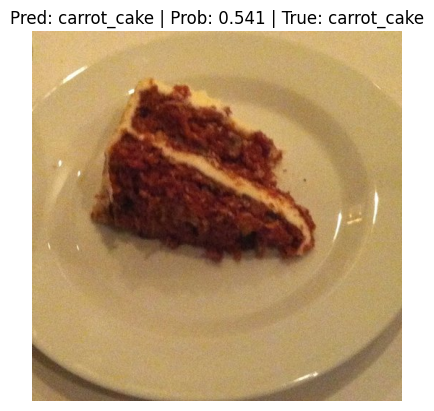

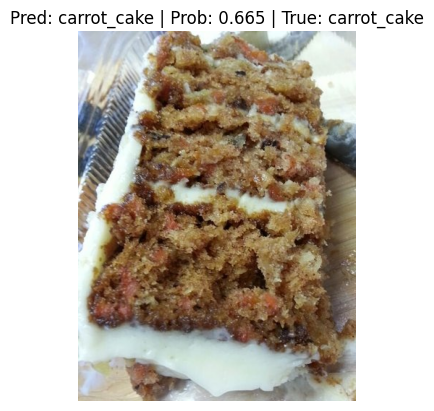

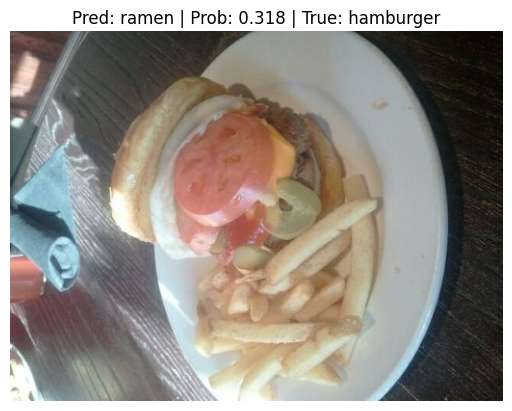

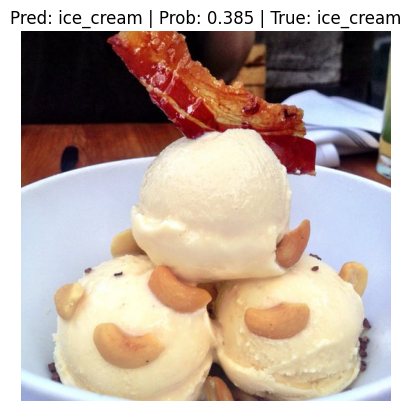

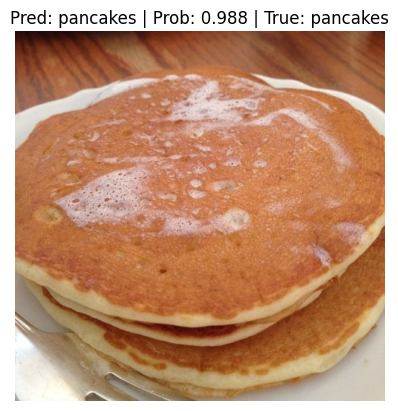

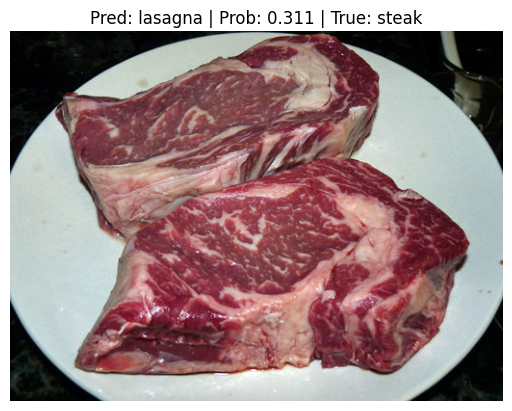

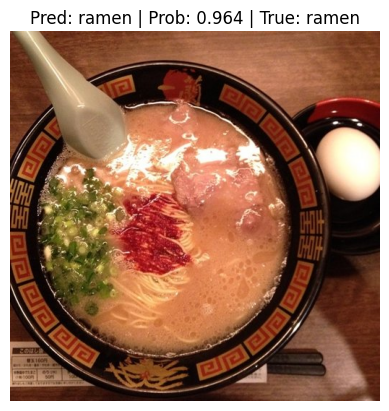

In [87]:
plot_random_predictions(
    model=model.model,
    test_dir=test_dir,
    class_names=class_names,
    num_images=10,
    transform=weights.transforms(),
    image_size=(224, 224),
    device=device
)

